<a href="https://colab.research.google.com/github/brothersanta/UT-AI/blob/main/ModelTuning_CreditCardChurn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Credit Card Users Churn Prediction

## Problem Statement

### Business Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

### **Please read the instructions carefully before starting the project.**
This is a commented Jupyter IPython Notebook file in which all the instructions and tasks to be performed are mentioned.
* Blanks '_______' are provided in the notebook that
needs to be filled with an appropriate code to get the correct result. With every '_______' blank, there is a comment that briefly describes what needs to be filled in the blank space.
* Identify the task to be performed correctly, and only then proceed to write the required code.
* Fill the code wherever asked by the commented lines like "# write your code here" or "# complete the code". Running incomplete code may throw error.
* Please run the codes in a sequential manner from the beginning to avoid any unnecessary errors.
* Add the results/observations (wherever mentioned) derived from the analysis in the presentation and submit the same.


## Importing necessary libraries

In [ ]:
# Imblearn libary is used to handle imbalanced data

# Jupyter notebook
!pip install imblearn --user

!pip install imbalanced-learn --user

In [ ]:
# IMPORT LIBRARIES
# To help with reading and manipulation of data
import numpy as np
import pandas as pd

# To help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To split the data
from sklearn.model_selection import train_test_split

# To impute missing values
from sklearn.impute import SimpleImputer

# To create confusion matrices
from sklearn.metrics import confusion_matrix, classification_report

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To help with model building
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
    )
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression

# To oversample and undersample data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# to create k folds of data and get cross validation score
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

# To tune a model
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

# To get different performance metrics
import sklearn.metrics as metrics
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    recall_score,
    accuracy_score,
    precision_score,
    f1_score,
)

# To suppress warnings
import warnings

warnings.filterwarnings("ignore")

## Loading the dataset

In [ ]:
from google.colab import files
uploaded = files.upload()
df = "BankChurners.csv"
BC = pd.read_csv(df)


Saving BankChurners.csv to BankChurners (1).csv


NameError: ignored

## Data Overview

- Observations
- Sanity checks

In [ ]:
BC.shape

(10127, 21)

In [ ]:
BC.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,...,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [ ]:
BC.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,...,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,...,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,...,2,4,10388.000,1961,8427.000,0.703,10294,61,0.649,0.189


In [ ]:
BC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [ ]:
BC["Attrition_Flag"].value_counts()

Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64

In [ ]:
round(BC.isnull().sum() / BC.count() * 100, 2)

CLIENTNUM                   0.000
Attrition_Flag              0.000
Customer_Age                0.000
Gender                      0.000
Dependent_count             0.000
Education_Level            17.650
Marital_Status              7.990
Income_Category             0.000
Card_Category               0.000
Months_on_book              0.000
Total_Relationship_Count    0.000
Months_Inactive_12_mon      0.000
Contacts_Count_12_mon       0.000
Credit_Limit                0.000
Total_Revolving_Bal         0.000
Avg_Open_To_Buy             0.000
Total_Amt_Chng_Q4_Q1        0.000
Total_Trans_Amt             0.000
Total_Trans_Ct              0.000
Total_Ct_Chng_Q4_Q1         0.000
Avg_Utilization_Ratio       0.000
dtype: float64

In [ ]:
BC["Gender"].value_counts()

F    5358
M    4769
Name: Gender, dtype: int64

In [ ]:
BC['Education_Level'].unique()

array(['High School', 'Graduate', 'Uneducated', nan, 'College',
       'Post-Graduate', 'Doctorate'], dtype=object)

In [ ]:
BC["Education_Level"].value_counts()

Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

In [ ]:
BC['Marital_Status'].unique()

array(['Married', 'Single', nan, 'Divorced'], dtype=object)

In [ ]:
BC['Income_Category'].unique()

array(['$60K - $80K', 'Less than $40K', '$80K - $120K', '$40K - $60K',
       '$120K +', 'abc'], dtype=object)

In [ ]:
BC['Income_Category'].value_counts()

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
abc               1112
$120K +            727
Name: Income_Category, dtype: int64

In [ ]:
BC[BC['Income_Category']=='abc']

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
19,709327383,Existing Customer,45,F,2,Graduate,Married,abc,Blue,37,...,1,2,14470.000,1157,13313.000,0.966,1207,21,0.909,0.080
28,718813833,Existing Customer,44,F,3,Uneducated,Single,abc,Blue,34,...,2,2,10100.000,0,10100.000,0.525,1052,18,1.571,0.000
39,708300483,Attrited Customer,66,F,0,Doctorate,Married,abc,Blue,56,...,4,3,7882.000,605,7277.000,1.052,704,16,0.143,0.077
44,720572508,Existing Customer,38,F,4,Graduate,Single,abc,Blue,28,...,3,3,9830.000,2055,7775.000,0.977,1042,23,0.917,0.209
58,711427458,Existing Customer,44,F,5,Graduate,Married,abc,Blue,35,...,1,2,6273.000,978,5295.000,2.275,1359,25,1.083,0.156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10021,711149133,Attrited Customer,30,F,1,Graduate,Married,abc,Blue,18,...,1,4,4377.000,2517,1860.000,0.941,8759,74,0.609,0.575
10040,714677583,Attrited Customer,50,F,3,Doctorate,Single,abc,Blue,36,...,3,3,5173.000,0,5173.000,0.912,8757,68,0.789,0.000
10083,718170033,Existing Customer,42,F,4,Uneducated,Married,abc,Blue,23,...,1,2,8348.000,0,8348.000,0.695,15905,111,0.708,0.000
10092,713437008,Attrited Customer,40,F,3,Graduate,Married,abc,Blue,25,...,2,3,6888.000,1878,5010.000,1.059,9038,64,0.829,0.273


In [ ]:
BC["Card_Category"].value_counts()

Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64

In [ ]:
#OBSERVATIONS
## The data has loaded successfully
## "Attrition_Flag" is the target feature
## The data set has 21 columns which can be used as features; the first column is the key
## 17.65% of Education_Level data is null
## 7.9% of Marital_Status data is null
## 10.9% of Income_Category data is "abc", unusable data
## There is object data that may need to be mapped to numerical values to support modeling in: Attrition_Flag, Gender, Education_Level, Marital_Status, Income_Category, Card_Category

In [ ]:
#SANITY CHECKS
## The data set has 10127 rows; there is probably sufficient data to create meaningful splits for training, validation, and testing data sets
## The data for CLIENTNUM will likely be meaningless to modeling and can be dropped
##


## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

In [ ]:
BC.describe()

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,10127.000,10127.000,10127.000,10127.000,10127.000,10127.000,10127.000,10127.000,10127.000,10127.000,10127.000,10127.000,10127.000,10127.000,10127.000
mean,739177606.334,46.326,2.346,35.928,3.813,2.341,2.455,8631.954,1162.814,7469.140,0.760,4404.086,64.859,0.712,0.275
std,36903783.450,8.017,1.299,7.986,1.554,1.011,1.106,9088.777,814.987,9090.685,0.219,3397.129,23.473,0.238,0.276
min,708082083.000,26.000,0.000,13.000,1.000,0.000,0.000,1438.300,0.000,3.000,0.000,510.000,10.000,0.000,0.000
25%,713036770.500,41.000,1.000,31.000,3.000,2.000,2.000,2555.000,359.000,1324.500,0.631,2155.500,45.000,0.582,0.023
50%,717926358.000,46.000,2.000,36.000,4.000,2.000,2.000,4549.000,1276.000,3474.000,0.736,3899.000,67.000,0.702,0.176
75%,773143533.000,52.000,3.000,40.000,5.000,3.000,3.000,11067.500,1784.000,9859.000,0.859,4741.000,81.000,0.818,0.503
max,828343083.000,73.000,5.000,56.000,6.000,6.000,6.000,34516.000,2517.000,34516.000,3.397,18484.000,139.000,3.714,0.999


**Questions**:

1. How is the total transaction amount distributed?
2. What is the distribution of the level of education of customers?
3. What is the distribution of the level of income of customers?
4. How does the change in transaction amount between Q4 and Q1 (`total_ct_change_Q4_Q1`) vary by the customer's account status (`Attrition_Flag`)?
5. How does the number of months a customer was inactive in the last 12 months (`Months_Inactive_12_mon`) vary by the customer's account status (`Attrition_Flag`)?
6. What are the attributes that have a strong correlation with each other?



#### The below functions need to be defined to carry out the Exploratory Data Analysis.

In [ ]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )
    # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )
    # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram


In [ ]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [ ]:
# function to plot stacked bar chart

def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

In [ ]:
### Function to plot distributions

def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

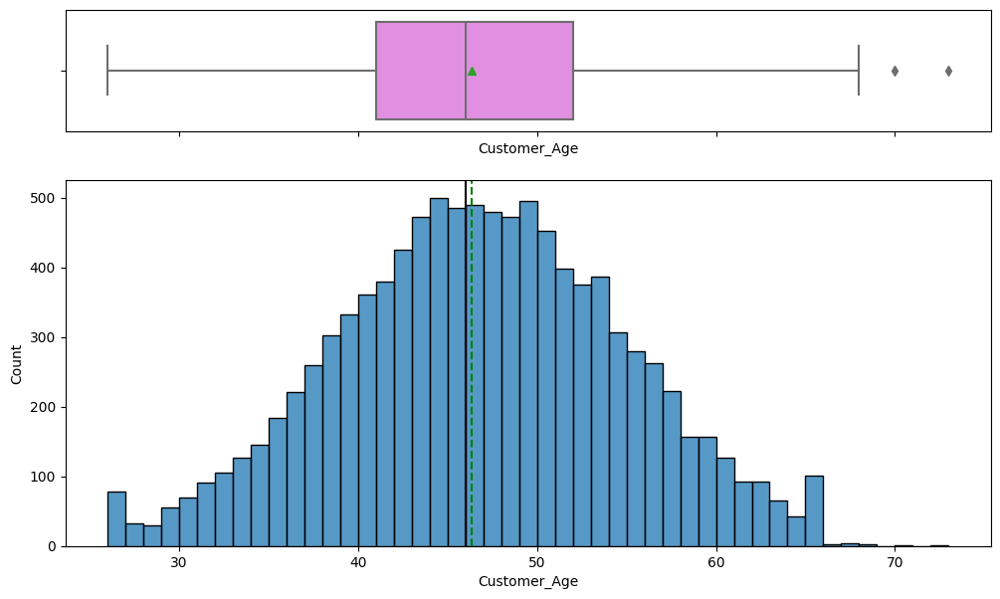

In [ ]:
histogram_boxplot(BC,"Customer_Age")
plt.show()

Attrition_Flag  Attrited Customer  Existing Customer    All
Gender                                                     
All                          1627               8500  10127
F                             930               4428   5358
M                             697               4072   4769
------------------------------------------------------------------------------------------------------------------------


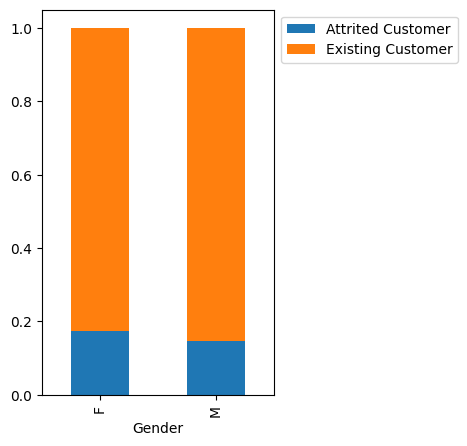

In [ ]:
stacked_barplot(BC,"Gender", "Attrition_Flag")

Attrition_Flag   Attrited Customer  Existing Customer    All
Dependent_count                                             
All                           1627               8500  10127
3                              482               2250   2732
2                              417               2238   2655
1                              269               1569   1838
4                              260               1314   1574
0                              135                769    904
5                               64                360    424
------------------------------------------------------------------------------------------------------------------------


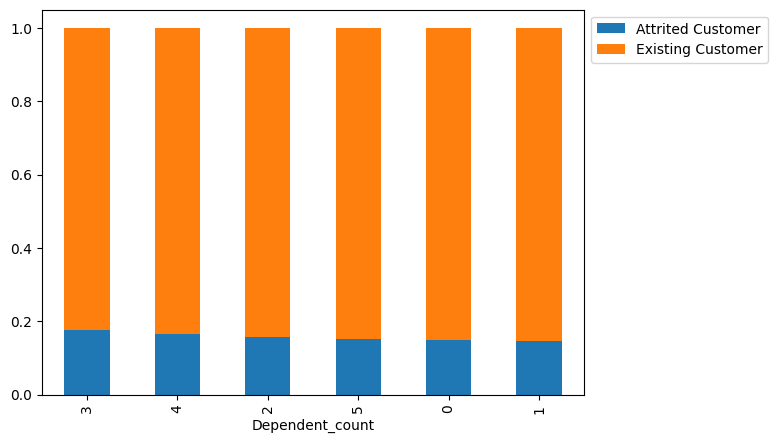

In [ ]:
stacked_barplot(BC,"Dependent_count", "Attrition_Flag")

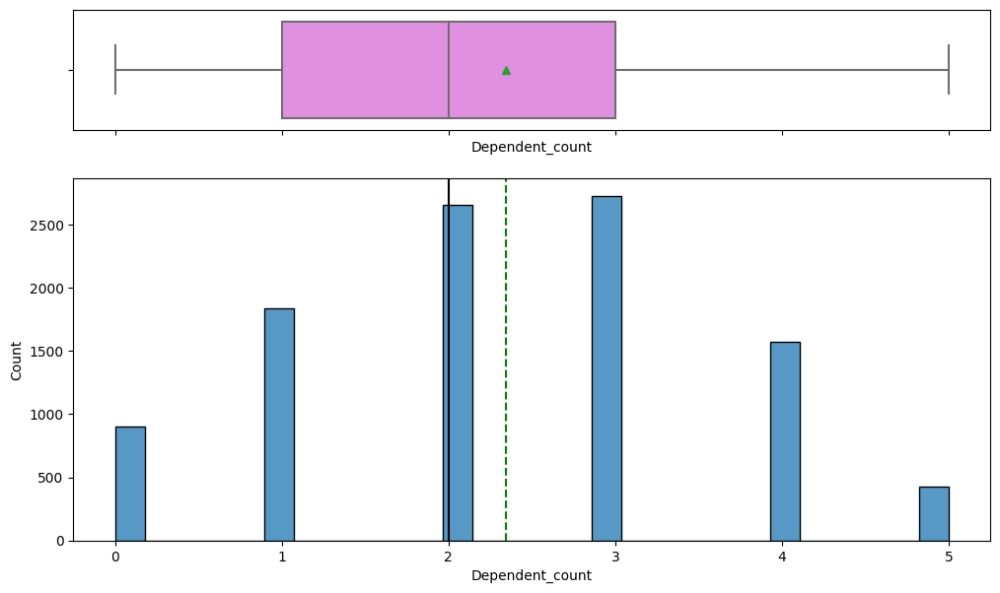

In [ ]:
histogram_boxplot(BC,"Dependent_count")
plt.show()

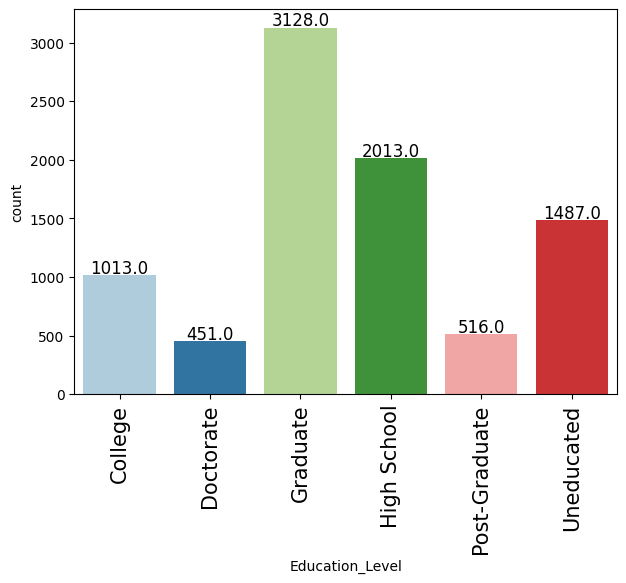

In [ ]:
labeled_barplot(BC, "Education_Level")

Attrition_Flag   Attrited Customer  Existing Customer   All
Education_Level                                            
All                           1371               7237  8608
Graduate                       487               2641  3128
High School                    306               1707  2013
Uneducated                     237               1250  1487
College                        154                859  1013
Doctorate                       95                356   451
Post-Graduate                   92                424   516
------------------------------------------------------------------------------------------------------------------------


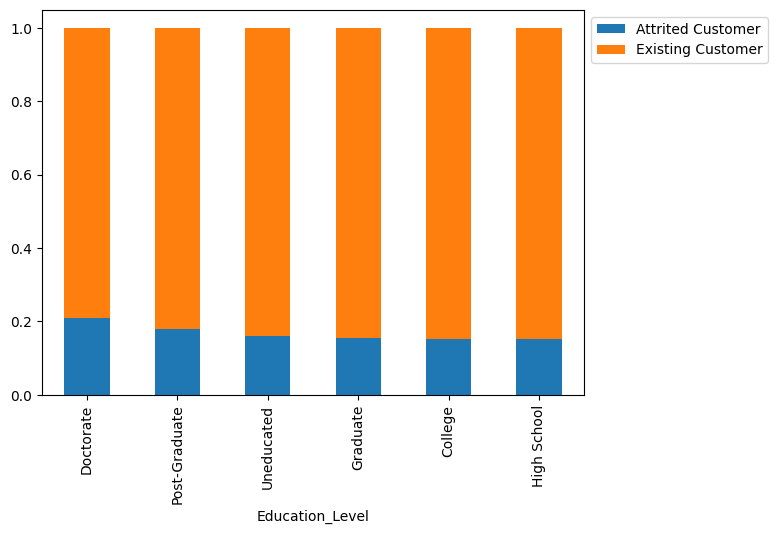

In [ ]:
stacked_barplot(BC,"Education_Level", "Attrition_Flag")

Attrition_Flag  Attrited Customer  Existing Customer   All
Marital_Status                                            
All                          1498               7880  9378
Married                       709               3978  4687
Single                        668               3275  3943
Divorced                      121                627   748
------------------------------------------------------------------------------------------------------------------------


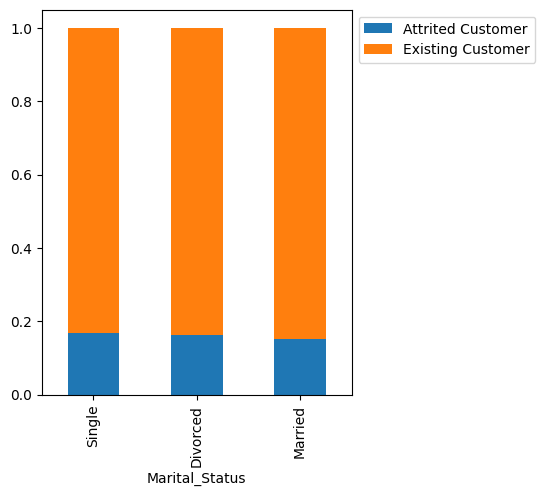

In [ ]:
stacked_barplot(BC,"Marital_Status", "Attrition_Flag")

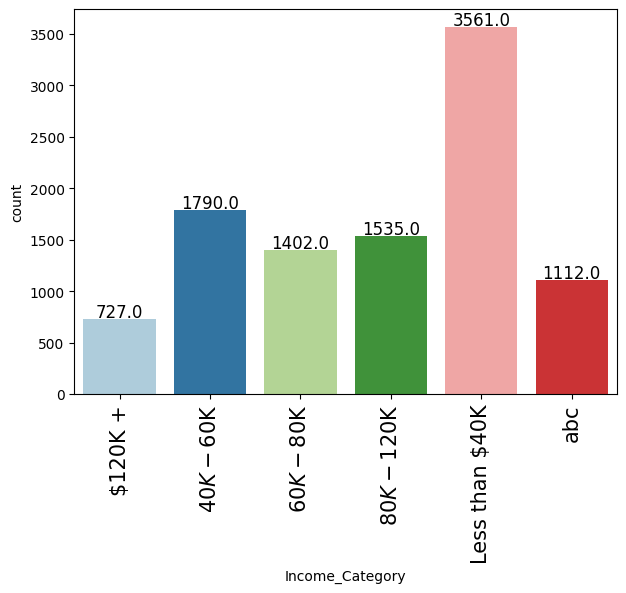

In [ ]:
labeled_barplot(BC, "Income_Category")

Attrition_Flag   Attrited Customer  Existing Customer    All
Income_Category                                             
All                           1627               8500  10127
Less than $40K                 612               2949   3561
$40K - $60K                    271               1519   1790
$80K - $120K                   242               1293   1535
$60K - $80K                    189               1213   1402
abc                            187                925   1112
$120K +                        126                601    727
------------------------------------------------------------------------------------------------------------------------


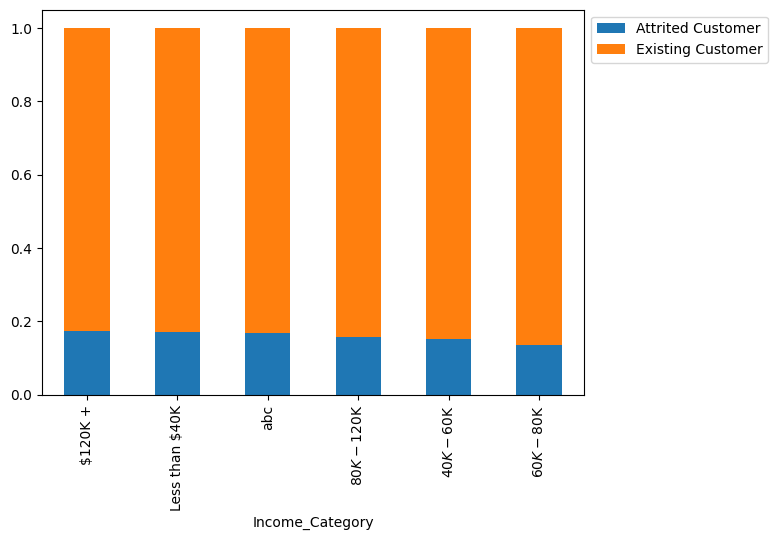

In [ ]:
stacked_barplot(BC,"Income_Category", "Attrition_Flag")

Attrition_Flag  Attrited Customer  Existing Customer    All
Card_Category                                              
All                          1627               8500  10127
Blue                         1519               7917   9436
Silver                         82                473    555
Gold                           21                 95    116
Platinum                        5                 15     20
------------------------------------------------------------------------------------------------------------------------


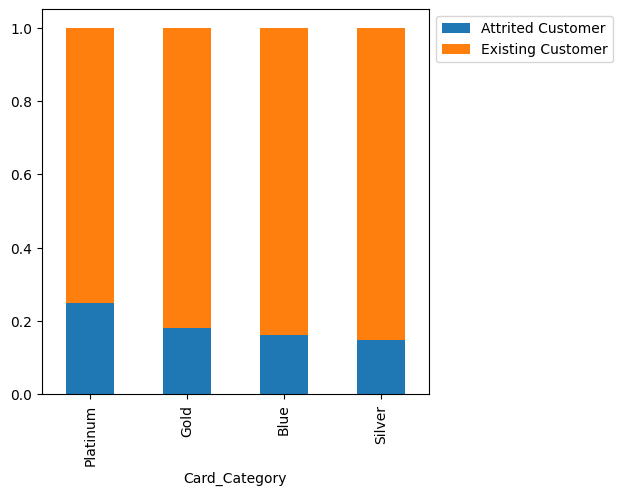

In [ ]:
stacked_barplot(BC,"Card_Category", "Attrition_Flag")

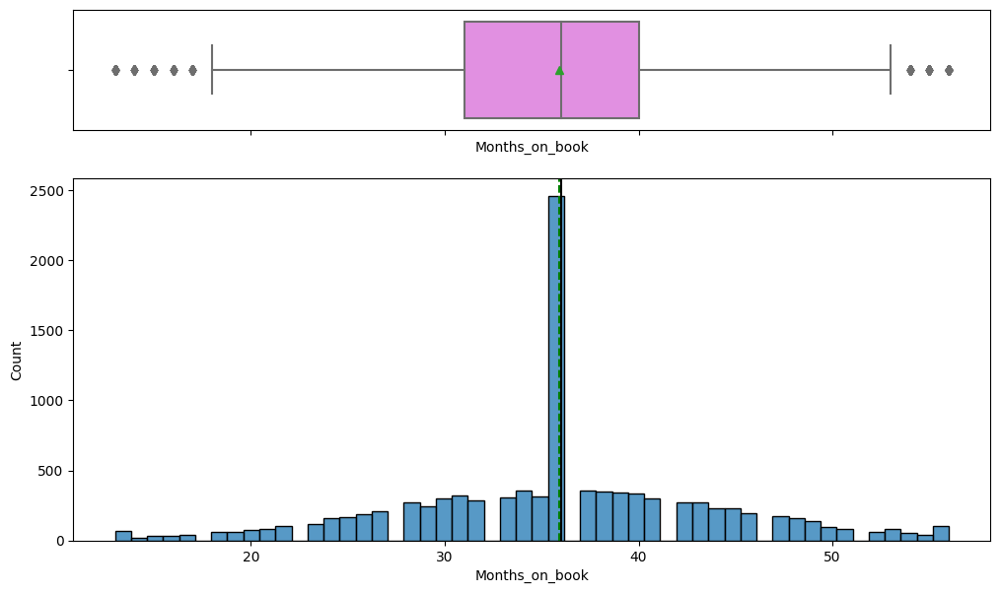

In [ ]:
histogram_boxplot(BC,"Months_on_book")

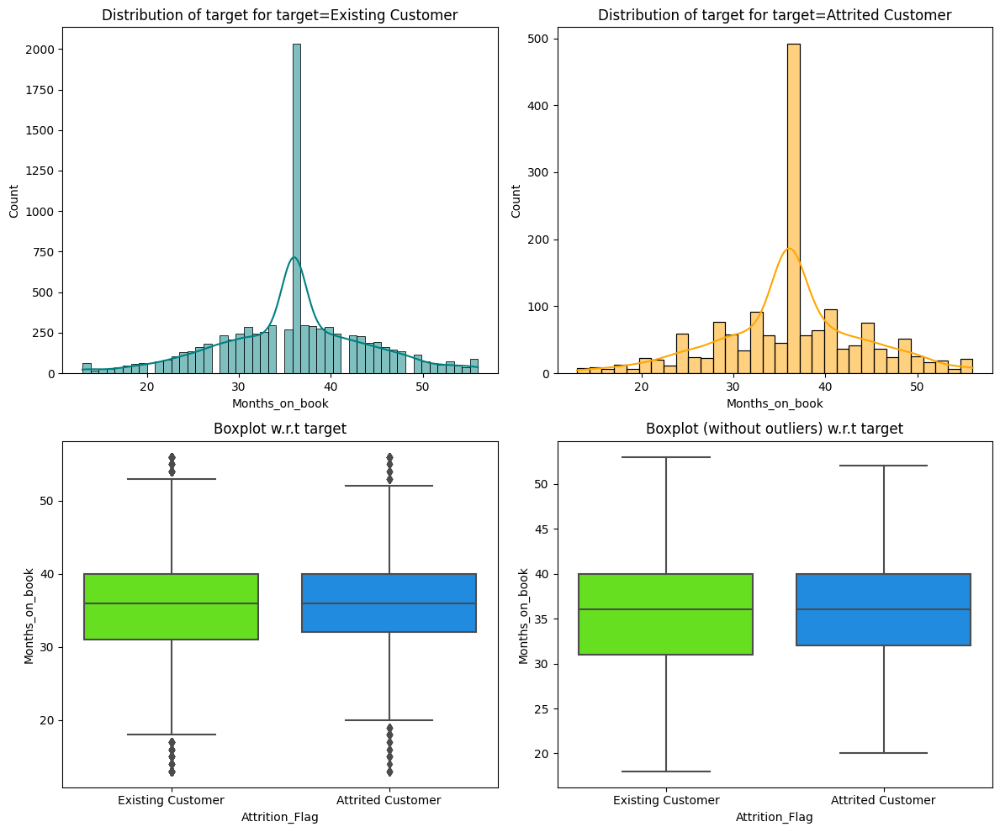

In [ ]:
distribution_plot_wrt_target(BC,"Months_on_book", "Attrition_Flag")

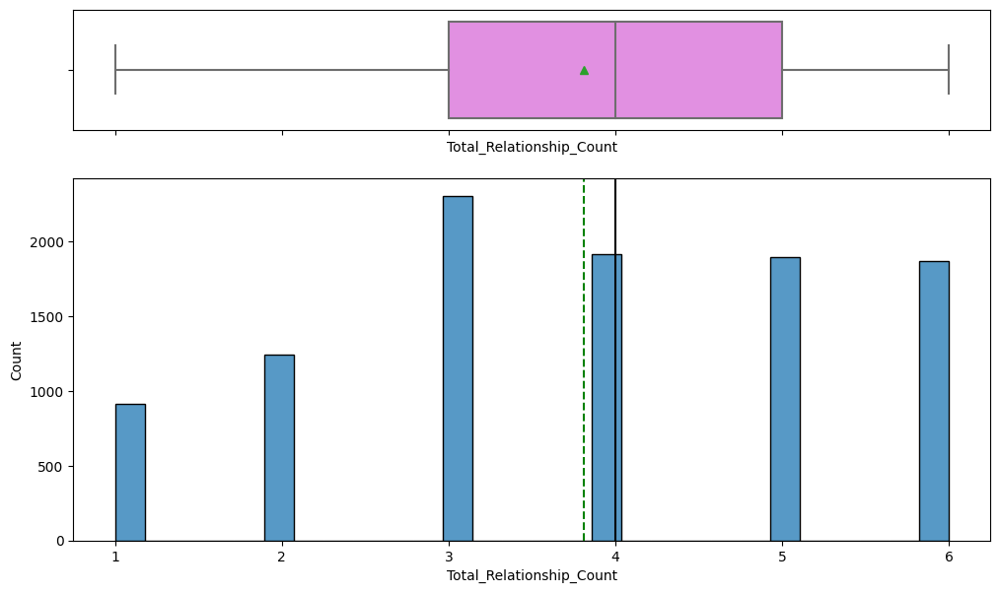

In [ ]:
histogram_boxplot(BC,"Total_Relationship_Count")

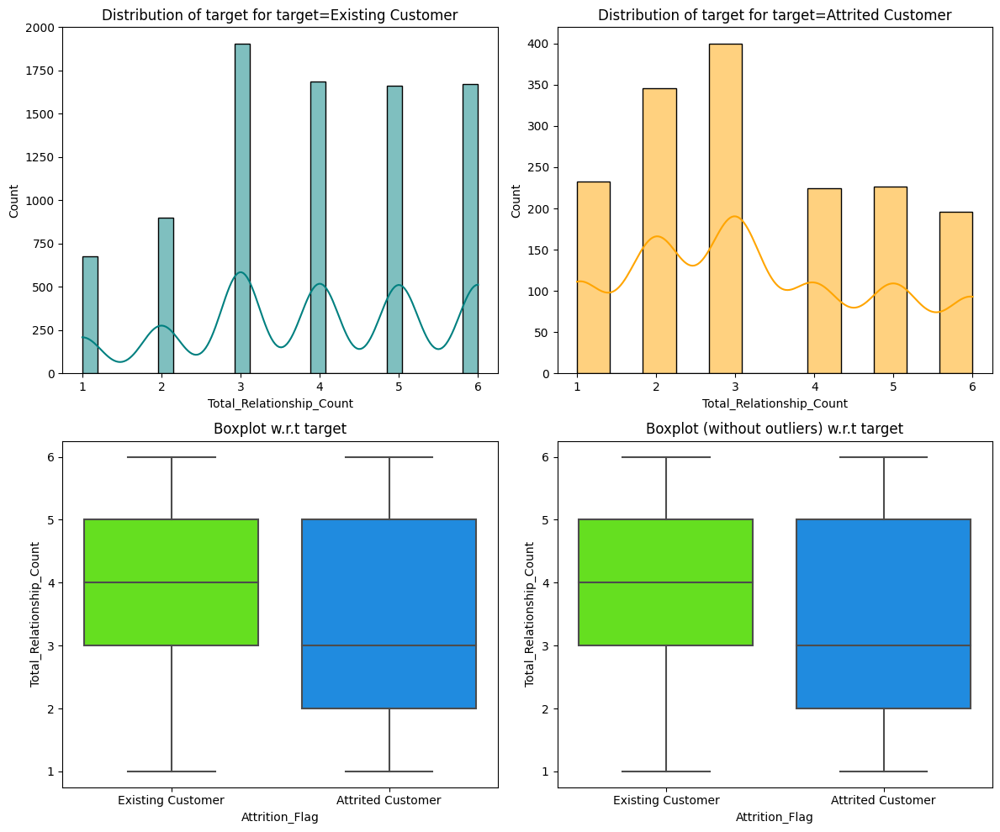

In [ ]:
distribution_plot_wrt_target(BC,"Total_Relationship_Count", "Attrition_Flag")

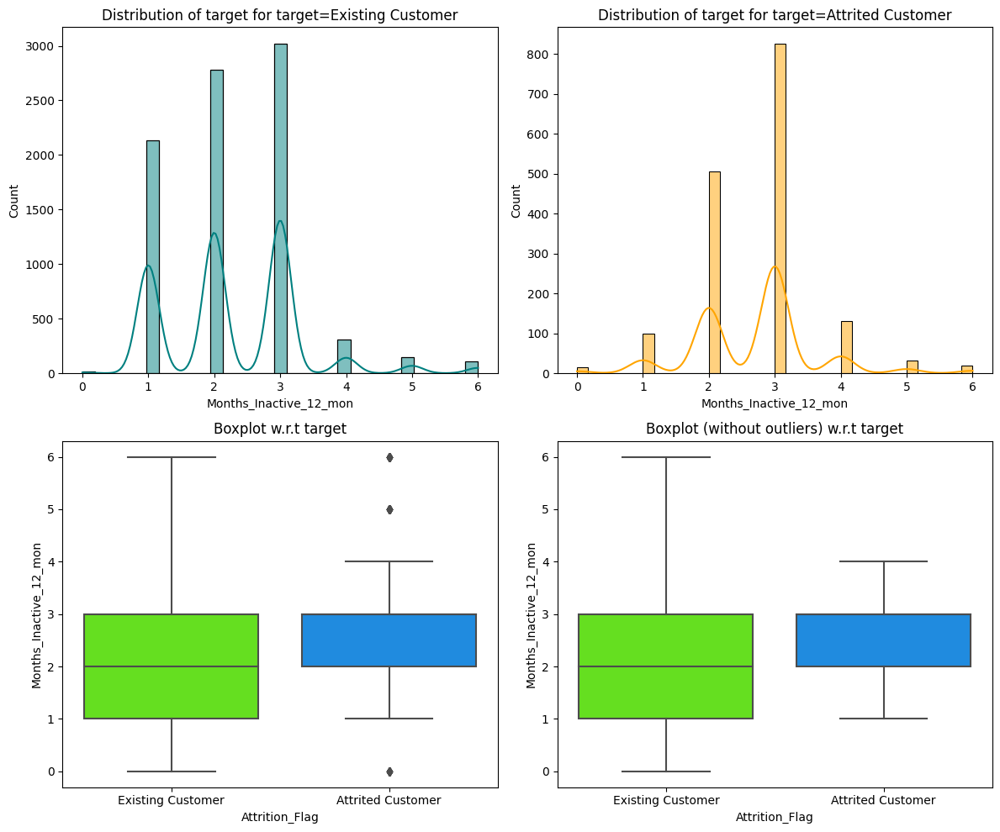

In [ ]:
distribution_plot_wrt_target(BC,"Months_Inactive_12_mon", "Attrition_Flag")

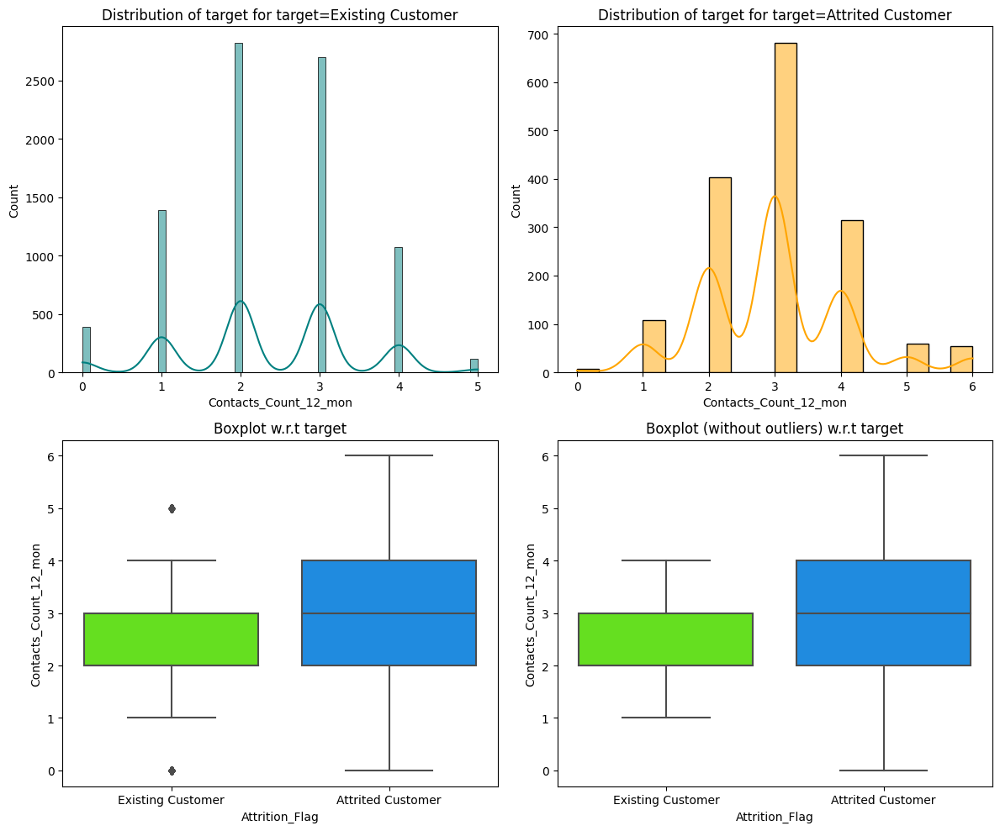

In [ ]:
distribution_plot_wrt_target(BC,"Contacts_Count_12_mon", "Attrition_Flag")

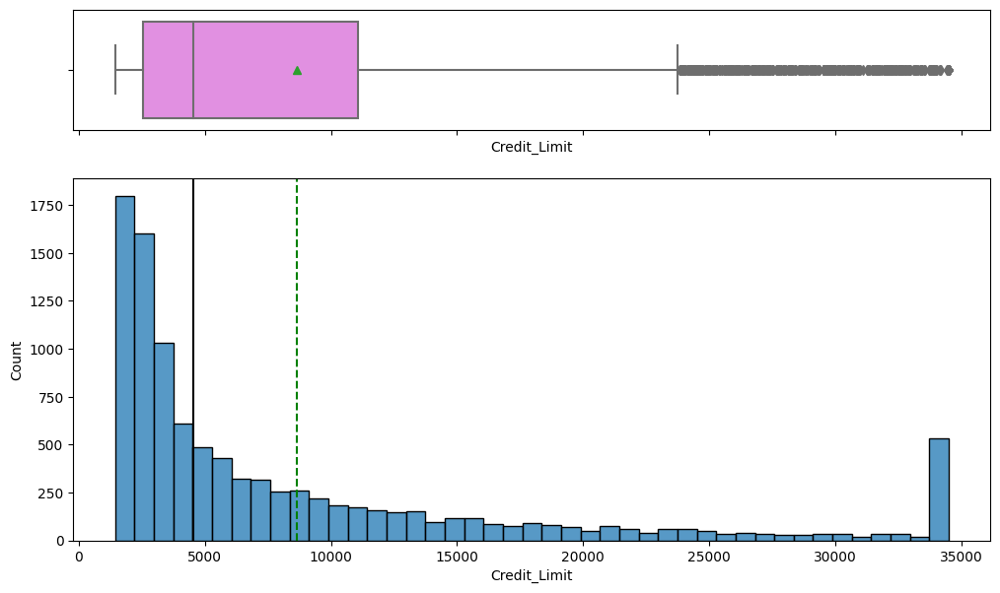

In [ ]:
histogram_boxplot(BC,"Credit_Limit")
plt.show()

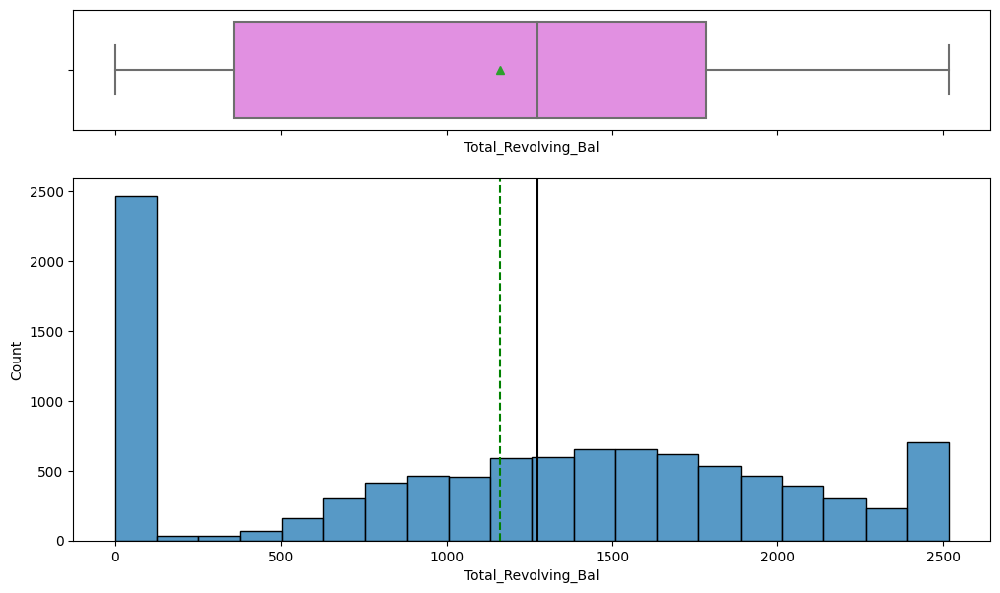

In [ ]:
histogram_boxplot(BC,"Total_Revolving_Bal")

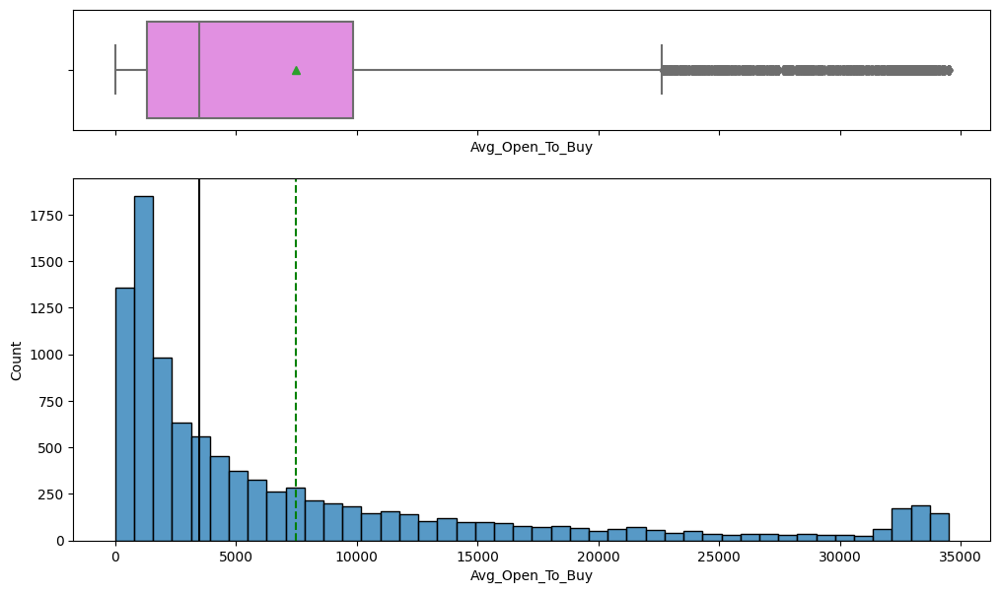

In [ ]:
histogram_boxplot(BC,"Avg_Open_To_Buy")

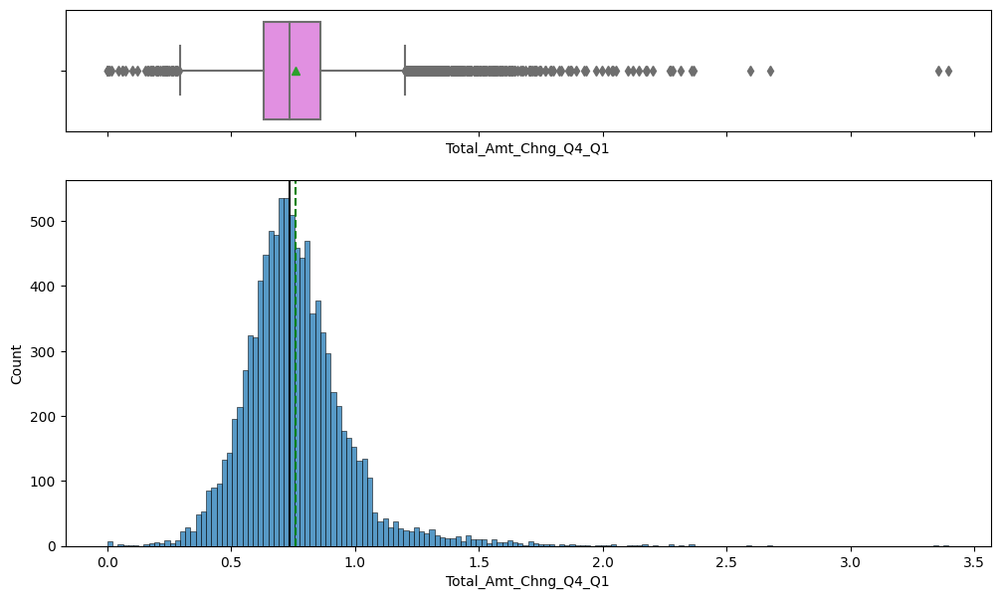

In [ ]:
histogram_boxplot(BC,"Total_Amt_Chng_Q4_Q1")

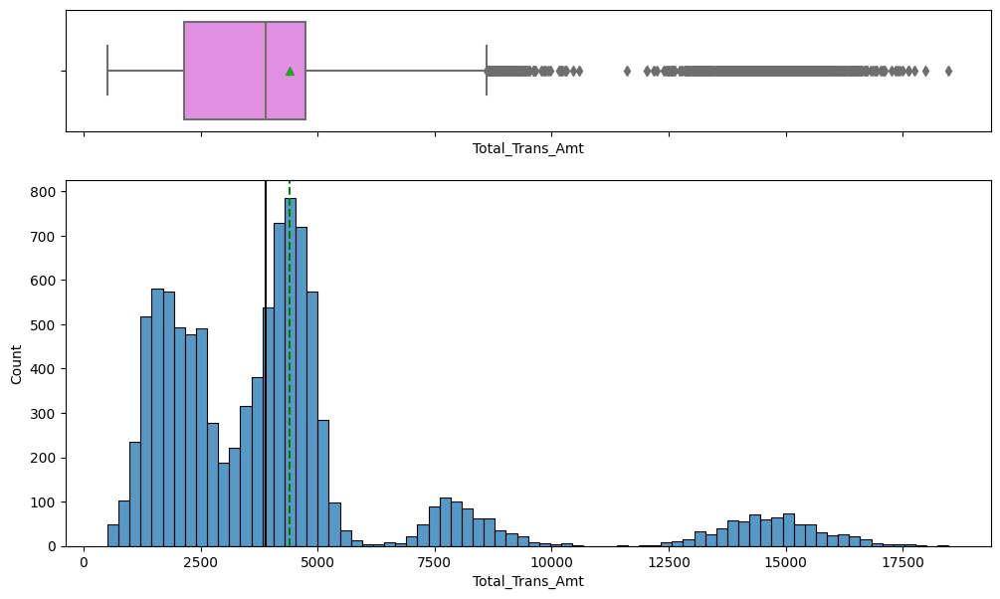

In [ ]:
histogram_boxplot(BC,"Total_Trans_Amt")

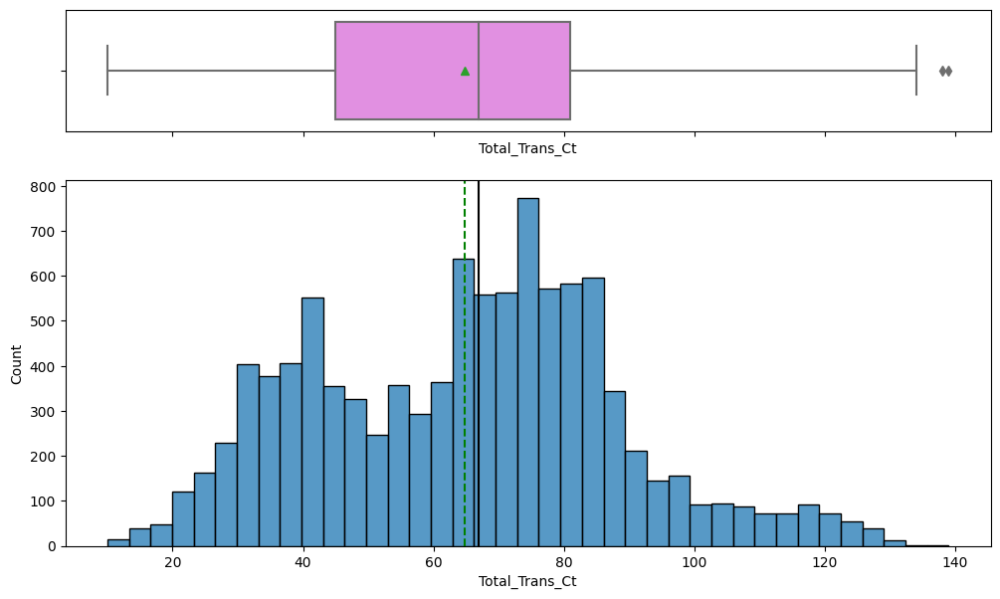

In [ ]:
histogram_boxplot(BC,"Total_Trans_Ct")

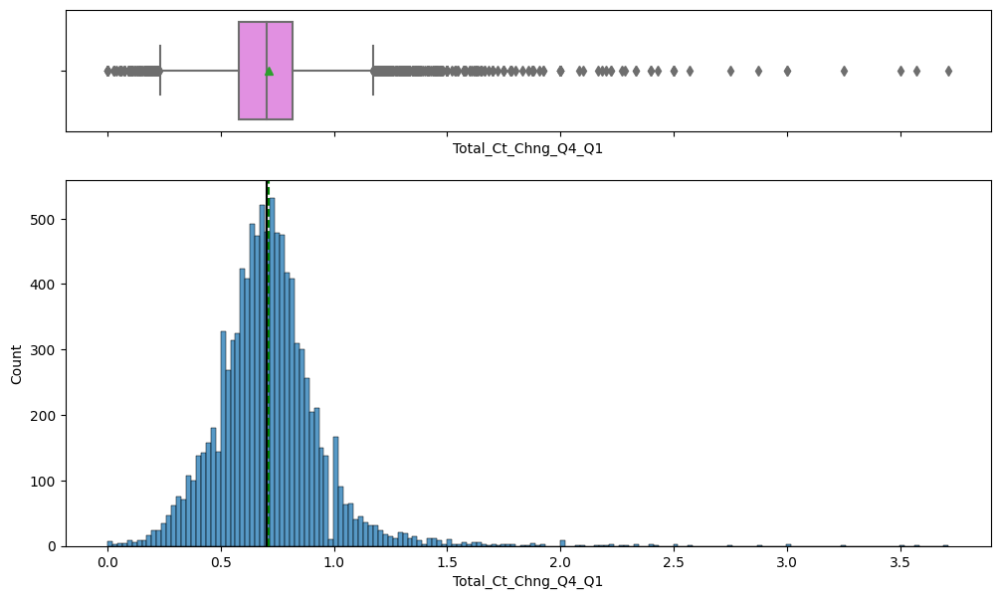

In [ ]:
histogram_boxplot(BC,"Total_Ct_Chng_Q4_Q1")

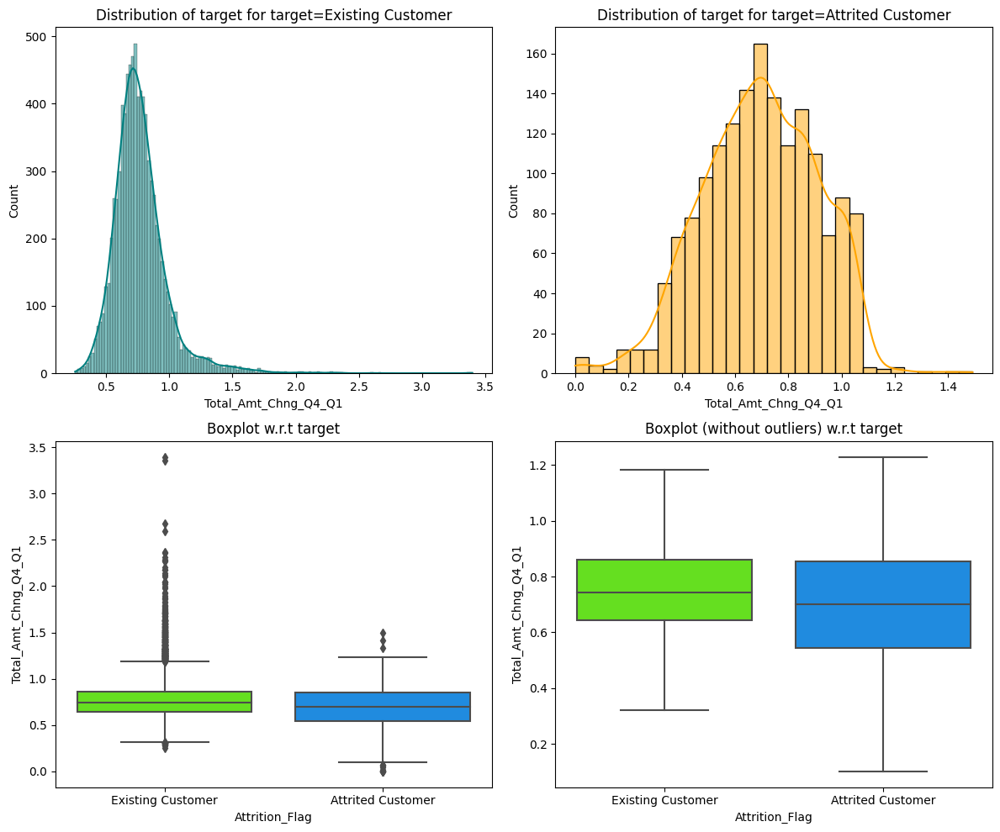

In [ ]:
distribution_plot_wrt_target(BC,"Total_Amt_Chng_Q4_Q1", "Attrition_Flag")

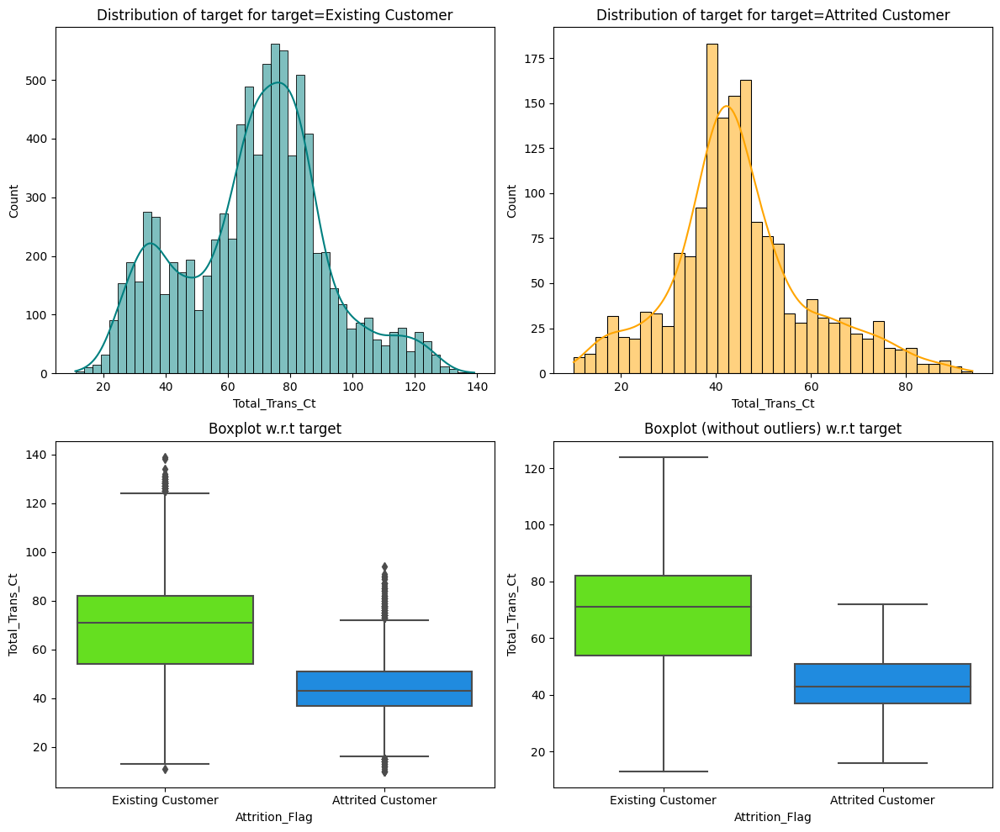

In [ ]:
distribution_plot_wrt_target(BC,"Total_Trans_Ct", "Attrition_Flag")

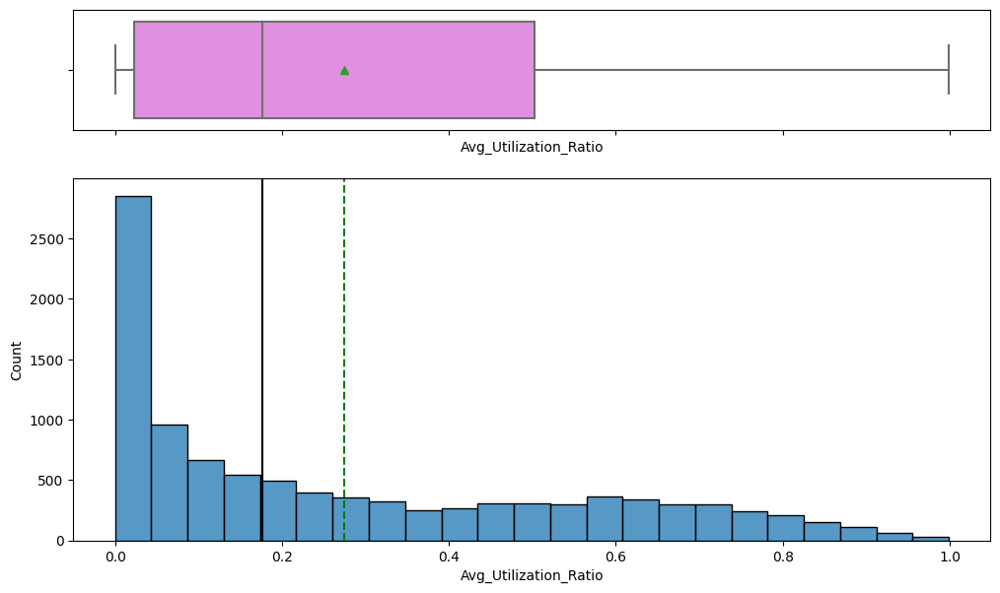

In [ ]:
histogram_boxplot(BC,"Avg_Utilization_Ratio")

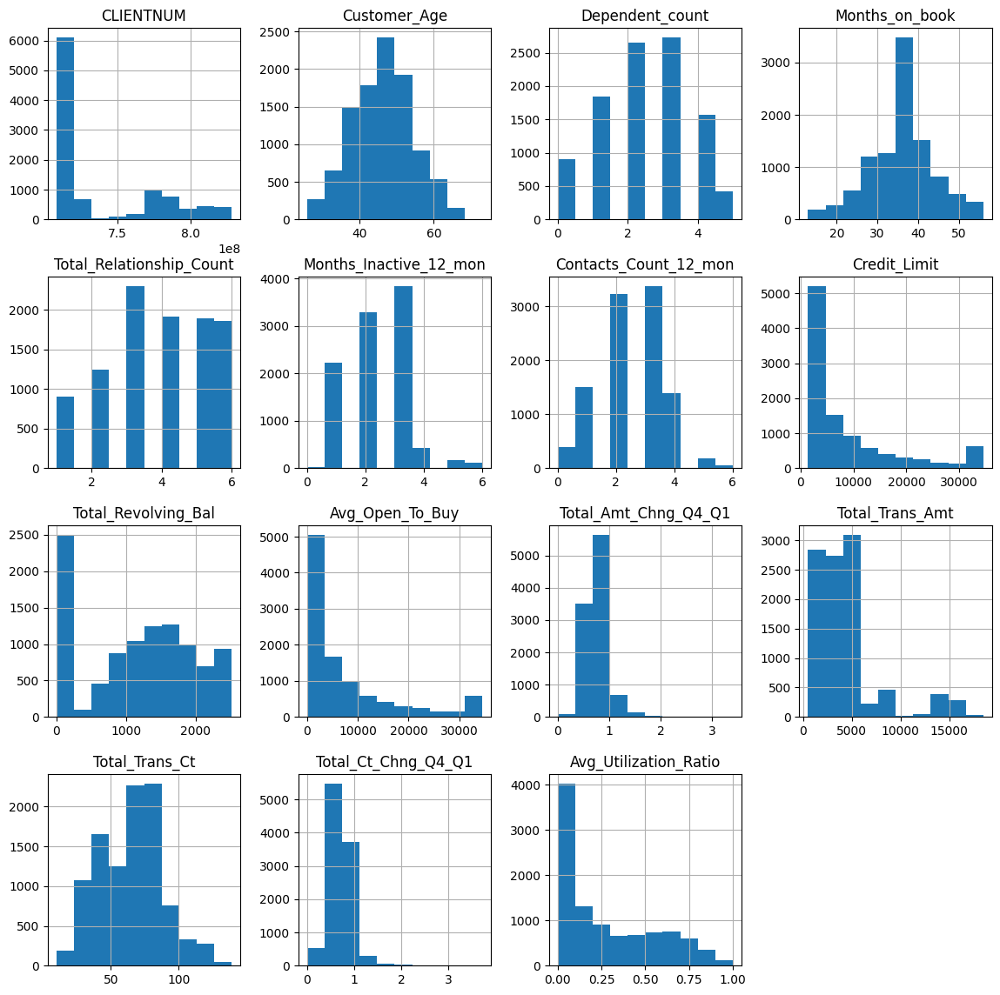

In [ ]:
BC.hist(figsize=(14, 14))
plt.show()

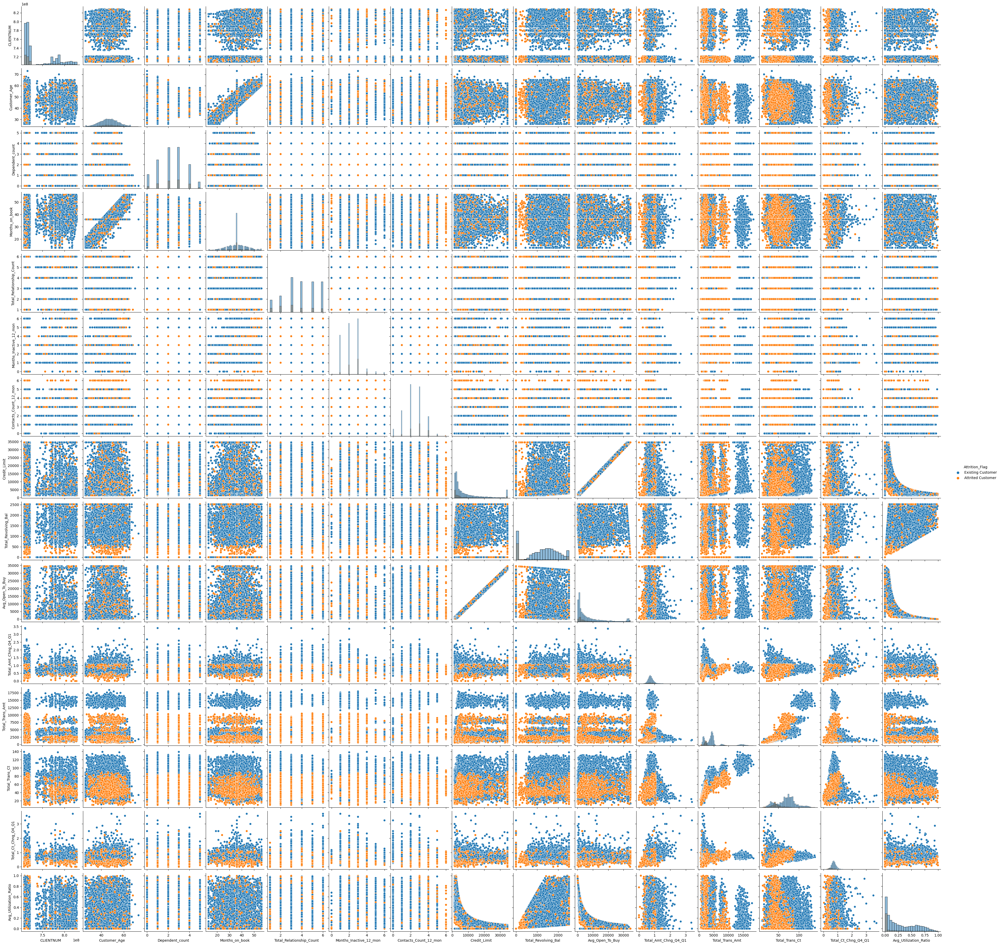

In [ ]:
sns.pairplot(data=BC, hue = 'Attrition_Flag', diag_kind = 'hist')
plt.show()

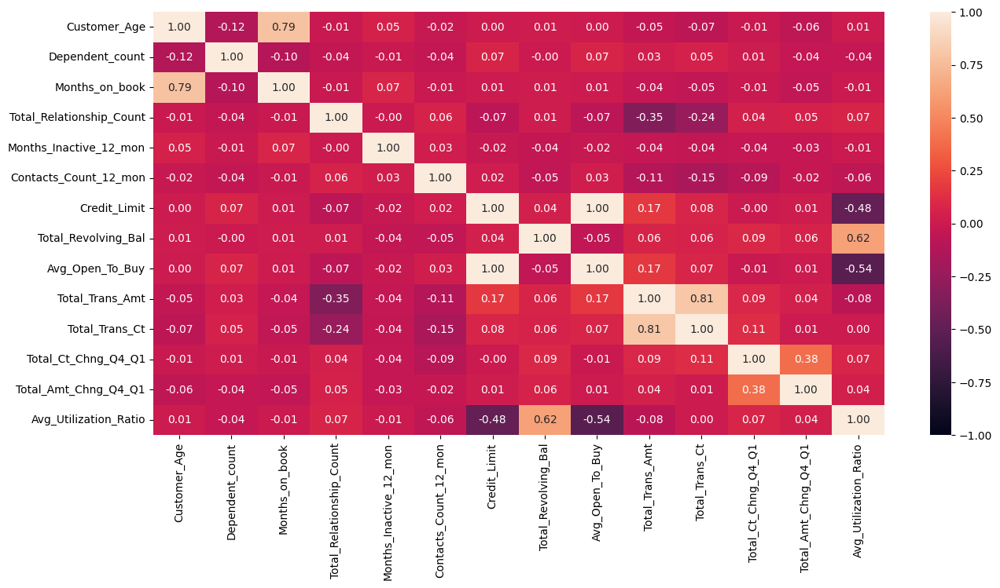

In [ ]:
## check for correlation
col_list = ['Attrition_Flag','Customer_Age','Gender','Dependent_count','Education_Level','Card_Category','Months_on_book','Total_Relationship_Count','Months_Inactive_12_mon','Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Total_Amt_Chng_Q4_Q1', 'Avg_Utilization_Ratio']
plt.figure(figsize=(15,7))
sns.heatmap(BC[col_list].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f")
plt.show()

In [ ]:
#How is the total transaction amount distributed?
### Total Transaction Amount is not uniformly distributed. The mean is $4404, and skews to the right due to a large number of outliers with high transaction amounts

#What is the distribution of the level of education of customers?
### The customer base is highly educated, with 60% of valid data holding college degrees or higher; 40% have graduate degrees

#What is the distribution of the level of income of customers?
### 35% of valid responses reported an income of less than $40K
### Only 22% of valid responses reported an imcome of $80K or higher (727 respondents @ $120K+ and 1535 respondents @ $80-$120K)
### 10% of responses were 'abc'; this data is invalid

#How does the change in transaction amount between Q4 and Q1 (total_ct_change_Q4_Q1) vary by the customer's account status (Attrition_Flag)?
### Existing Customers have a slightly higher change in transaction amount between Q4 and Q1 compared to Attrited Customers
### Existing Customers have a significant higher change in transaction count between Q4 and Q1 compared to Attrited Customers

#How does the number of months a customer was inactive in the last 12 months (Months_Inactive_12_mon) vary by the customer's account status (Attrition_Flag)?
### The number of months that a customer was inactive varies more widely for Existing Customers compared to Attrited Customers

#What are the attributes that have a strong correlation with each other?
### Avg_Open_to_Buy is perfectly correlated to Credit Limit
### Months_on_book shows strong correlation to Customer Age
### Total_Transaction_Amt is highly correlated with Total_Transaction_Ct

## Data Pre-processing

In [ ]:
#Drop data for CLIENTNUM
BC.drop(["CLIENTNUM"], axis=1, inplace=True)

In [ ]:
#Encode data for Attrition_Flag
BC=BC.replace('Attrited Customer', 1)
BC=BC.replace('Existing Customer', 0)


In [ ]:
#Encode data for Gender
BC['Gender'] = BC['Gender'].replace('M', 1)
BC['Gender'] = BC['Gender'].replace('F', 0)

In [ ]:
BC['Marital_Status'] = BC['Marital_Status'].replace('NaN', 'none')

In [ ]:
#Encode data for Marital_Status
BC = pd.get_dummies(BC,columns=['Marital_Status'])


In [ ]:
#Encode data for Education_Level
BC=BC.replace(np.nan, 0)
BC=BC.replace('Uneducated', 1)
BC=BC.replace('High School', 2)
BC=BC.replace('College', 3)
BC=BC.replace('Post-Graduate', 4)
BC=BC.replace('Graduate', 5)
BC=BC.replace('Doctorate', 6)



In [ ]:
#Encode data for Income_Category
BC=BC.replace('abc', 0)
BC=BC.replace('Less than $40K', 1)
BC=BC.replace('$40K - $60K', 2)
BC=BC.replace('$60K - $80K', 3)
BC=BC.replace('$80K - $120K', 4)
BC=BC.replace('$120K +', 5)



In [ ]:
#Encode data for Card_Category
BC=BC.replace('Blue', 1)
BC=BC.replace('Silver', 2)
BC=BC.replace('Gold', 3)
BC=BC.replace('Platinum', 4)

In [ ]:
BC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  int64  
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  int64  
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  int64  
 5   Income_Category           10127 non-null  int64  
 6   Card_Category             10127 non-null  int64  
 7   Months_on_book            10127 non-null  int64  
 8   Total_Relationship_Count  10127 non-null  int64  
 9   Months_Inactive_12_mon    10127 non-null  int64  
 10  Contacts_Count_12_mon     10127 non-null  int64  
 11  Credit_Limit              10127 non-null  float64
 12  Total_Revolving_Bal       10127 non-null  int64  
 13  Avg_Open_To_Buy           10127 non-null  float64
 14  Total_

In [ ]:
BC.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,...,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Marital_Status_0,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single
0,0,45,1,3,2,3,1,39,5,1,...,11914.000,1.335,1144,42,1.625,0.061,0,0,1,0
1,0,49,0,5,5,1,1,44,6,1,...,7392.000,1.541,1291,33,3.714,0.105,0,0,0,1
2,0,51,1,3,5,4,1,36,4,1,...,3418.000,2.594,1887,20,2.333,0.000,0,0,1,0
3,0,40,0,4,2,1,1,34,3,4,...,796.000,1.405,1171,20,2.333,0.760,1,0,0,0
4,0,40,1,3,1,3,1,21,5,1,...,4716.000,2.175,816,28,2.500,0.000,0,0,1,0


In [ ]:
BC.tail()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,...,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Marital_Status_0,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single
10122,0,50,1,2,5,2,1,40,3,2,...,2152.000,0.703,15476,117,0.857,0.462,0,0,0,1
10123,1,41,1,2,0,2,1,25,4,2,...,2091.000,0.804,8764,69,0.683,0.511,0,1,0,0
10124,1,44,0,1,2,1,1,36,5,3,...,5409.000,0.819,10291,60,0.818,0.000,0,0,1,0
10125,1,30,1,2,5,2,1,36,4,3,...,5281.000,0.535,8395,62,0.722,0.000,1,0,0,0
10126,1,43,0,2,5,1,2,25,6,2,...,8427.000,0.703,10294,61,0.649,0.189,0,0,1,0


## Missing value imputation




In [ ]:
## 17.65% of Education_Level data is N/A; Attrited customers slightly skews towards customers with doctorates and post-graduate education
## 7.9% of Marital_Status data is NaN; there seems to be little impact of status on attrition
## 10.9% of Income_Category data is "abc" and is unusable data; there seems to be little impact of Income Category on attrition


In [ ]:
#Replace blank values for Education_Level; changed N/A to zeroes

In [ ]:
#Marital_Status "Nan" has been replaced with "none" and then encoded into three separate columns with "nan" zeroed out; there is low correlation between Marital_Status and Attrition_Flag, so there is low impact of any effect

In [ ]:
#Replaced 'abc' values for Income_Category with '0' in encoding step above

## Model Building

In [ ]:
# Split the data into independent and dependent variables
X = BC.drop(["Attrition_Flag"], axis=1)
y = BC["Attrition_Flag"]

In [ ]:
# Split the data into training, validation, and test sets, with 20% of the data reserved for final test
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1, stratify=y)

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.25, random_state=1, stratify=y_temp)

# 25% of the 80% will be val, and 75% of the 80% will be our training set
print(X_train.shape, X_val.shape, X_test.shape)

(6075, 22) (2026, 22) (2026, 22)


### Model evaluation criterion

The nature of predictions made by the classification model will translate as follows:

- True positives (TP) are failures correctly predicted by the model.
- False negatives (FN) are real failures in a generator where there is no detection by model.
- False positives (FP) are failure detections in a generator where there is no failure.

**Which metric to optimize?**

* We need to choose the metric which will ensure that the maximum number of generator failures are predicted correctly by the model.
* We would want Recall to be maximized as greater the Recall, the higher the chances of minimizing false negatives.
* We want to minimize false negatives because if a model predicts that a machine will have no failure when there will be a failure, it will increase the maintenance cost.

**Let's define a function to output different metrics (including recall) on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**

In [ ]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1

        },
        index=[0],
    )

    return df_perf

### Model Building with original data

Sample code for model building with original data

In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Dtree", DecisionTreeClassifier(class_weight={0:0.16,1:0.84},random_state=1)))
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("Abc", AdaBoostClassifier(random_state=1)))
models.append(("gbc", GradientBoostingClassifier(random_state=1)))
models.append(("Xgb", XGBClassifier(random_state=1,eval_metric='logloss')))
## Completed the code to append remaining 3 models in the list models

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))


Training Performance:

Dtree: 1.0
Bagging: 0.9866803278688525
Random forest: 1.0
Abc: 0.8452868852459017
gbc: 0.8760245901639344
Xgb: 1.0

Validation Performance:

Dtree: 0.7760736196319018
Bagging: 0.803680981595092
Random forest: 0.803680981595092
Abc: 0.8773006134969326
gbc: 0.8588957055214724
Xgb: 0.8926380368098159


### Model Building with Oversampled data


In [ ]:
# Synthetic Minority Over Sampling Technique
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Dtree", DecisionTreeClassifier(class_weight={0:0.16,1:0.84},random_state=1)))
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("Abc", AdaBoostClassifier(random_state=1)))
models.append(("gbc", GradientBoostingClassifier(random_state=1)))
models.append(("Xgb", XGBClassifier(random_state=1,eval_metric='logloss')))
## Completed the code to append remaining 3 models in the list models

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_train_over, model.predict(X_train_over))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))


Training Performance:

Dtree: 1.0
Bagging: 0.9976465973720338
Random forest: 1.0
Abc: 0.9648950774661699
gbc: 0.9786232594626397
Xgb: 1.0

Validation Performance:

Dtree: 0.7484662576687117
Bagging: 0.8711656441717791
Random forest: 0.8680981595092024
Abc: 0.8987730061349694
gbc: 0.911042944785276
Xgb: 0.9141104294478528


### Model Building with Undersampled data

In [ ]:
# Random undersampler for under sampling the data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Dtree", DecisionTreeClassifier(class_weight={0:0.16,1:0.84},random_state=1)))
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("Abc", AdaBoostClassifier(random_state=1)))
models.append(("gbc", GradientBoostingClassifier(random_state=1)))
models.append(("Xgb", XGBClassifier(random_state=1,eval_metric='logloss')))

## Completed the code to append remaining 3 models in the list models

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_train_un, model.predict(X_train_un))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))



Training Performance:

Dtree: 1.0
Bagging: 0.9907786885245902
Random forest: 1.0
Abc: 0.9528688524590164
gbc: 0.9795081967213115
Xgb: 1.0

Validation Performance:

Dtree: 0.8834355828220859
Bagging: 0.9263803680981595
Random forest: 0.9386503067484663
Abc: 0.9601226993865031
gbc: 0.9631901840490797
Xgb: 0.9601226993865031


### HyperparameterTuning

#### Sample Parameter Grids

**Hyperparameter tuning can take a long time to run, so to avoid that time complexity - you can use the following grids, wherever required.**

- For Gradient Boosting:

```
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(75,150,25),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "subsample":[0.5,0.7,1],
    "max_features":[0.5,0.7,1],
}
```

- For Adaboost:

```
param_grid = {
     "n_estimators": np.arange(10, 110, 10),
     "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
     "base_estimator": [
         DecisionTreeClassifier(max_depth=1, random_state=1),
         DecisionTreeClassifier(max_depth=2, random_state=1),
         DecisionTreeClassifier(max_depth=3, random_state=1),
    ]
}
```

- For Bagging Classifier:

```
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
}
```
- For Random Forest:

```
param_grid = {
    "n_estimators": [200,250,300],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}
```

- For Decision Trees:

```
param_grid = {
    'max_depth': np.arange(2,6),
    'min_samples_leaf': [1, 4, 7],
    'max_leaf_nodes' : [10, 15],
    'min_impurity_decrease': [0.0001,0.001]
}
```

- For XGBoost:

```
param_grid={
   'n_estimators':np.arange(50,300,50),
   'scale_pos_weight':[0,1,2,5,10],
   'learning_rate':[0.01,0.1,0.2,0.05],
   'gamma':[0,1,3,5],
   'subsample':[0.7,0.8,0.9,1]
}
```

#### Sample tuning method for Decision tree with original data

In [ ]:
# defining model
Model = DecisionTreeClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {'max_depth': np.arange(2,6),
              'min_samples_leaf': [1, 4, 7],
              'max_leaf_nodes' : [10,15],
              'min_impurity_decrease': [0.0001,0.001] }

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring= "recall", cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'min_samples_leaf': 7, 'min_impurity_decrease': 0.0001, 'max_leaf_nodes': 15, 'max_depth': 5} with CV score=0.751941391941392:


#### Sample tuning method for Decision tree with oversampled data

In [ ]:
# defining model
Model = DecisionTreeClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {'max_depth': np.arange(2,6),
              'min_samples_leaf': [1, 4, 7],
              'max_leaf_nodes' : [10,15],
              'min_impurity_decrease': [0.0001,0.001] }

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring= "recall", cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_over,y_train_over)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'min_samples_leaf': 1, 'min_impurity_decrease': 0.001, 'max_leaf_nodes': 15, 'max_depth': 4} with CV score=0.9115543881929613:


#### Sample tuning method for Decision tree with undersampled data

In [ ]:
# defining model
Model = DecisionTreeClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {'max_depth': np.arange(2,20),
              'min_samples_leaf': [1, 2, 5, 7],
              'max_leaf_nodes' : [5, 10,15],
              'min_impurity_decrease': [0.0001,0.001] }

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring= "recall", cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'min_samples_leaf': 1, 'min_impurity_decrease': 0.001, 'max_leaf_nodes': 5, 'max_depth': 14} with CV score=0.9539141810570383:


In [ ]:
# defining model
Model = BaggingClassifier(random_state=1)

# Paremeter grid to pass in RandomSearchCV
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
}

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring= "recall", cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))


Best parameters are {'n_estimators': 70, 'max_samples': 1, 'max_features': 0.8} with CV score=1.0:


In [ ]:
# defining model
Model = RandomForestClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": [200,250,300],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring= "recall", cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))


Best parameters are {'n_estimators': 250, 'min_samples_leaf': 2, 'max_samples': 0.5, 'max_features': 'sqrt'} with CV score=0.9303035060177919:


In [ ]:
# defining model
Model = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
     "n_estimators": np.arange(10, 110, 10),
     "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
     "base_estimator": [
         DecisionTreeClassifier(max_depth=1, random_state=1),
         DecisionTreeClassifier(max_depth=2, random_state=1),
         DecisionTreeClassifier(max_depth=3, random_state=1),
    ]
}

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring= "recall", cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))


Best parameters are {'n_estimators': 70, 'learning_rate': 0.1, 'base_estimator': DecisionTreeClassifier(max_depth=2, random_state=1)} with CV score=0.9446886446886447:


In [ ]:
# defining model
Model = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(75,150,25),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "subsample":[0.5,0.7,1],
    "max_features":[0.5,0.7,1],
}

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring= "recall", cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))


Best parameters are {'subsample': 0.7, 'n_estimators': 125, 'max_features': 0.7, 'learning_rate': 0.2, 'init': AdaBoostClassifier(random_state=1)} with CV score=0.9569544740973314:


In [ ]:
# defining model
Model = XGBClassifier(random_state=1,eval_metric='logloss')

# Parameter grid to pass in RandomSearchCV
param_grid={
   'n_estimators':np.arange(50,300,50),
   'scale_pos_weight':[0,1,2,5,10],
   'learning_rate':[0.01,0.1,0.2,0.05],
   'gamma':[0,1,3,5],
   'subsample':[0.7,0.8,0.9,1]
}

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring= "recall", cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))


Best parameters are {'subsample': 0.7, 'scale_pos_weight': 10, 'n_estimators': 250, 'learning_rate': 0.2, 'gamma': 3} with CV score=0.9764468864468865:


## Model Comparison and Final Model Selection

### Test set final performance

In [ ]:
# Check the performance on test set

models = []  # Empty list to store all the models

# Pull best parameters into models
models.append(("Dtree", DecisionTreeClassifier(min_samples_leaf = 1, min_impurity_decrease = 0.001, max_leaf_nodes = 5, max_depth = 14, class_weight={0:0.16,1:0.84},random_state=1)))
models.append(("Bagging", BaggingClassifier(n_estimators = 70, max_samples = 1, max_features = 0.8, random_state = 1)))
models.append(("Random forest", RandomForestClassifier(n_estimators = 250, min_samples_leaf = 2, max_samples = 0.5, max_features = 'sqrt', random_state=1)))
models.append(("Abc", AdaBoostClassifier(n_estimators = 70, learning_rate = 0.1, base_estimator = DecisionTreeClassifier(max_depth=2, random_state=1))))
models.append(("gbc", GradientBoostingClassifier(subsample = 0.7, n_estimators = 125, max_features = 0.7, learning_rate = 0.2, init = AdaBoostClassifier(random_state=1))))
models.append(("Xgb", XGBClassifier(subsample = 0.7, scale_pos_weight = 10, n_estimators = 250, learning_rate = 0.2, gamma = 3, random_state=1, eval_metric = 'logloss')))
## Completed the code to append remaining 3 models in the list modelsm

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train))
    print("{}: {}".format(name, scores))

print("\n" "Test Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores_test = recall_score(y_test, model.predict(X_test))
    print("{}: {}".format(name, scores_test))


Training Performance:

Dtree: 0.9559426229508197
Bagging: 0.0
Random forest: 0.9098360655737705
Abc: 0.8012295081967213
gbc: 0.951844262295082
Xgb: 1.0

Test Performance:

Dtree: 0.96
Bagging: 0.0
Random forest: 0.7476923076923077
Abc: 0.7907692307692308
gbc: 0.9107692307692308
Xgb: 0.963076923076923


In [ ]:
# Models were built for: Decision, tree, Bagging, Random Forest, AdaBoost, Gradient Boosting, and XGB
# Models were trained with oversampled and undersampled data
# Models were hypertuned with RandomSearchCSV
# Analysis of bagging may be flawed; performance scores were very high, and acheived what seemed to be a perfect 1.0 in hypertuning, but when parameters were replaced, the score went to 0
# Decision Tree seems like the strongest model because it has a high recall score in training (.955) and very close and even higher score in test (.96)

# Business Insights and Conclusions

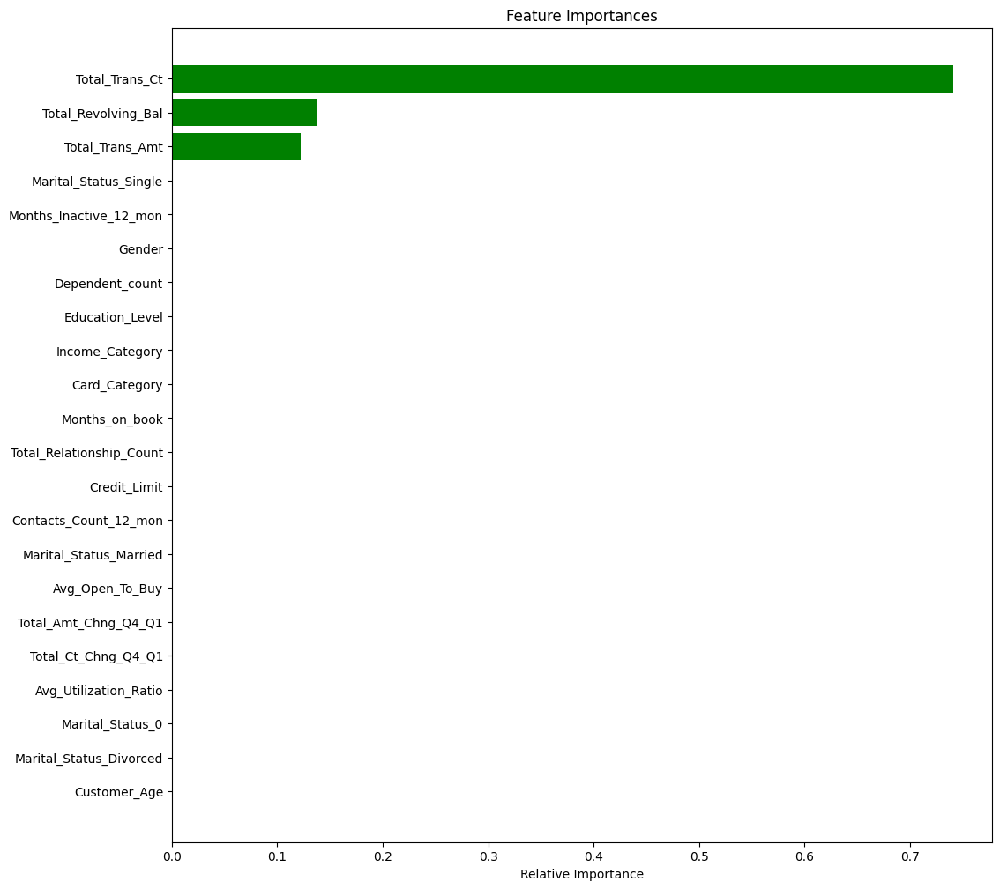

In [ ]:
# Get features for decision tree

importances = models[0][1].feature_importances_

indices = np.argsort(importances)

feature_names = X_train.columns

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='green', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [ ]:
# BUSINESS INSIGHTS & CONCLUSIONS
## There is one major classification factor for identifying Attrited Customers - high count of transactions
## There are two minor contribuing factors for identifying Attrited Customers - high revolving balance and total transaction amounts
## Thera Bank should focus improving its service towards customers that have a high count of transactions
## Marketing can be optimized by focusing on customers that have a high count of transactions that have a high revolving balance and total transaction amounts

***